<a href="https://colab.research.google.com/github/raquelcreis/CastoresIndomaveis/blob/master/Projeto_01_Raquel_Reis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  Projeto 01 - Análise de Viagens de Bicicleta

Como o mais novo cientista de dados da Cycle Sharing CO. seu objetivo nesse projeto é gerar dados e insights para as equipes de marketing e de operações. 

A equipe de marketing precisa entender qual é o perfil do nosso cliente em termos de sexo, idade, duração e localização das viagens para criarem um plano de propaganda que possa ser efetivo para grupos diferentes (é o seu papel definir quais serão os grupos e os que diferencia -- dica: gerações diferentes devem ser engajadas de formas diferentes). 

O time de operações gostaria de entender em termos geográficos, quais são as estações que mais são utilizadas, as que tem mais bicicletas retiradas, as que tem bicicletas mais entregues e se é necessário criar mais estações, se sim, onde ou se é melhor aumentar a quantidade de bicicletas na estação (dica: crie uma timeline diária de cada estação e veja quanto tempo cada estação passa sem nenhuma bicicleta, esse pode ser um indicador de que há bicicletas insuficientes). A equipe de operações também precisa saber, para fins de manutenção, quais as estações mais utilizadas em dias de chuva e neve.

# Método de Entrega

> O aluno deverá entregar a apresentação de slides em pdf + notebook com as análises e códigos em HTML pelo blackboard até o dia 30/10.

# Base **Trip**



## Leitura da base

In [ ]:
!pip install --upgrade geopandas

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas
import datetime
import folium as fl

     |████████████████████████████████| 972kB 4.8MB/s 
     |████████████████████████████████| 14.8MB 308kB/s 
     |████████████████████████████████| 10.9MB 45.8MB/s 


In [ ]:
df = pd.read_csv("https://raw.githubusercontent.com/raquelcreis/CastoresIndomaveis/master/projeto001/data/trip.csv",engine="python",error_bad_lines=False,warn_bad_lines=False)
df.head()

,trip_id,starttime,stoptime,bikeid,tripduration,from_station_name,to_station_name,from_station_id,to_station_id,usertype,gender,birthyear
0,431,10/13/2014 10:31,10/13/2014 10:48,SEA00298,985.935,2nd Ave & Spring St,Occidental Park / Occidental Ave S & S Washing...,CBD-06,PS-04,Member,Male,1960.0
1,432,10/13/2014 10:32,10/13/2014 10:48,SEA00195,926.375,2nd Ave & Spring St,Occidental Park / Occidental Ave S & S Washing...,CBD-06,PS-04,Member,Male,1970.0
2,433,10/13/2014 10:33,10/13/2014 10:48,SEA00486,883.831,2nd Ave & Spring St,Occidental Park / Occidental Ave S & S Washing...,CBD-06,PS-04,Member,Female,1988.0
3,434,10/13/2014 10:34,10/13/2014 10:48,SEA00333,865.937,2nd Ave & Spring St,Occidental Park / Occidental Ave S & S Washing...,CBD-06,PS-04,Member,Female,1977.0
4,435,10/13/2014 10:34,10/13/2014 10:49,SEA00202,923.923,2nd Ave & Spring St,Occidental Park / Occidental Ave S & S Washing...,CBD-06,PS-04,Member,Male,1971.0


In [ ]:
df.shape

(286857, 12)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286857 entries, 0 to 286856
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   trip_id            286857 non-null  int64  
 1   starttime          286857 non-null  object 
 2   stoptime           286857 non-null  object 
 3   bikeid             286857 non-null  object 
 4   tripduration       286857 non-null  float64
 5   from_station_name  286857 non-null  object 
 6   to_station_name    286857 non-null  object 
 7   from_station_id    286857 non-null  object 
 8   to_station_id      286857 non-null  object 
 9   usertype           286857 non-null  object 
 10  gender             181557 non-null  object 
 11  birthyear          181553 non-null  float64
dtypes: float64(2), int64(1), object(9)
memory usage: 26.3+ MB


## Data Cleaning




In [ ]:
df.usertype.unique()

array(['Member', 'Short-Term Pass Holder'], dtype=object)

In [ ]:
df[df.usertype == 'Short-Term Pass Holder'].birthyear

69       NaN
78       NaN
89       NaN
91       NaN
92       NaN
          ..
286852   NaN
286853   NaN
286854   NaN
286855   NaN
286856   NaN
Name: birthyear, Length: 105300, dtype: float64

### Missing Values



Há uma quantidade considerável de valores ausentes nas colunas "gênero" e "ano de nascimento". Sendo assim, faz-se necessário o tratamento dos valores ausentes para prosseguir com a análise dos dados.

**Gênero** é uma variável categórica dividida em 3 categorias: Masculino, Feminino e Outro. O preenchimento dos valores ausentes será feito por uma escolha randômica mantendo a mesma proporção entre as três categorias.

In [ ]:
df.gender.value_counts(normalize=True,dropna=False)

Male      0.490014
NaN       0.367082
Female    0.130943
Other     0.011961
Name: gender, dtype: float64

In [ ]:
df.birthyear.value_counts(normalize=True,dropna=False)

NaN       0.367096
1987.0    0.063195
1985.0    0.037179
1981.0    0.034697
1982.0    0.032870
            ...   
1936.0    0.000028
1999.0    0.000021
1942.0    0.000014
1944.0    0.000007
1931.0    0.000003
Name: birthyear, Length: 62, dtype: float64

In [ ]:
df.gender.value_counts(normalize=True)

Male      0.774214
Female    0.206888
Other     0.018898
Name: gender, dtype: float64

In [ ]:
df['gender'] = df['gender'].fillna(pd.Series(np.random.choice(['Male', 'Female', 'Other'], 
                                                      p=[0.77, 0.21, 0.02], size=len(df))))

In [ ]:
df.gender.value_counts(normalize=True,dropna=False)

Male      0.773239
Female    0.207528
Other     0.019233
Name: gender, dtype: float64

In [ ]:
df.birthyear.nunique()

61

Já no caso do **Ano de Nascimento**, que é uma variável quantitativa, será feito o seguinte passo a passo:


*   Calcular a idade
*   Agrupar em faixas etárias
*   Preencher os valores ausentes por categorias mantendo a mesma proporção

Assim, a variável quantitativa será transformada em uma variável categórica. 



In [ ]:
#Cálculo da Idade
df['age'] = 2016 - df.birthyear

In [ ]:
#Agrupamento em faixas etárias
bins = [20, 29, 39, 49, 59, 69, 79, np.inf]
names = ['20-29', '30-39', '40-49', '50-59', '60-69','70-79','80+']

df['agerange'] = pd.cut(df['age'], bins, labels=names)

In [ ]:
df[['age','agerange']].head(10)

,age,agerange
0,56.0,50-59
1,46.0,40-49
2,28.0,20-29
3,39.0,30-39
4,45.0,40-49
5,42.0,40-49
6,38.0,30-39
7,33.0,30-39
8,42.0,40-49
9,58.0,50-59


In [ ]:
#Tratamento dos valores ausentes
df.agerange.value_counts(normalize=True)

30-39    0.401607
20-29    0.306437
40-49    0.160211
50-59    0.096236
60-69    0.033233
70-79    0.002226
80+      0.000050
Name: agerange, dtype: float64

In [ ]:
df['agerange'] = df['agerange'].fillna(pd.Series(np.random.choice(['30-39', '40-49', '50-59', '20-29','60-69','70-79'], 
                                                      p=[0.53, 0.20, 0.13,0.08,0.04,0.02], size=len(df))))

In [ ]:
df.agerange.value_counts(normalize=True,dropna=False)

30-39    0.448513
20-29    0.223041
40-49    0.175310
50-59    0.108608
60-69    0.035446
70-79    0.009050
80+      0.000031
Name: agerange, dtype: float64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286857 entries, 0 to 286856
Data columns (total 14 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   trip_id            286857 non-null  int64   
 1   starttime          286857 non-null  object  
 2   stoptime           286857 non-null  object  
 3   bikeid             286857 non-null  object  
 4   tripduration       286857 non-null  float64 
 5   from_station_name  286857 non-null  object  
 6   to_station_name    286857 non-null  object  
 7   from_station_id    286857 non-null  object  
 8   to_station_id      286857 non-null  object  
 9   usertype           286857 non-null  object  
 10  gender             286857 non-null  object  
 11  birthyear          181553 non-null  float64 
 12  age                181553 non-null  float64 
 13  agerange           286857 non-null  category
dtypes: category(1), float64(3), int64(1), object(9)
memory usage: 28.7+ MB


### Extração de informação de dia, mês, ano e hora do passeio



Nas colunas **starttime** e **stoptime**, as informações de dia,dia da semana, mês, ano e hora estão juntas. Para melhorar a análise, é necessário deixar cada informação em uma coluna. A extração será feita apenas da variável **starttime**.

In [ ]:
df['day'] = pd.to_datetime(df['starttime'],format='%m/%d/%Y %H:%M').dt.day #dia
df['dayofw'] = pd.to_datetime(df['starttime'],format='%m/%d/%Y %H:%M').dt.day_name() #dia da semana
df['month'] = pd.to_datetime(df['starttime'],format='%m/%d/%Y %H:%M').dt.month #mês
df['month_year'] = pd.to_datetime(df['starttime']).dt.to_period('M') #mês e ano
df['year'] = pd.to_datetime(df['starttime'],format='%m/%d/%Y %H:%M').dt.year #ano
df['date'] = pd.to_datetime(df['starttime'],format='%m/%d/%Y %H:%M').dt.date #data
df['hour'] = pd.to_datetime(df['starttime'],format='%m/%d/%Y %H:%M').dt.hour #hora

In [ ]:
df[['starttime','day','dayofw','month','month_year','year','date','hour']].tail(10)

,starttime,day,dayofw,month,month_year,year,date,hour
286847,8/31/2016 22:13,31,Wednesday,8,2016-08,2016,2016-08-31,22
286848,8/31/2016 22:37,31,Wednesday,8,2016-08,2016,2016-08-31,22
286849,8/31/2016 22:44,31,Wednesday,8,2016-08,2016,2016-08-31,22
286850,8/31/2016 22:44,31,Wednesday,8,2016-08,2016,2016-08-31,22
286851,8/31/2016 22:47,31,Wednesday,8,2016-08,2016,2016-08-31,22
286852,8/31/2016 23:34,31,Wednesday,8,2016-08,2016,2016-08-31,23
286853,8/31/2016 23:48,31,Wednesday,8,2016-08,2016,2016-08-31,23
286854,8/31/2016 23:47,31,Wednesday,8,2016-08,2016,2016-08-31,23
286855,8/31/2016 23:49,31,Wednesday,8,2016-08,2016,2016-08-31,23
286856,8/31/2016 23:49,31,Wednesday,8,2016-08,2016,2016-08-31,23


### Coluna estação do ano

Para fazer a classificação das estações, será considerado o mês do **starttime.**

In [ ]:
bins = [1, 2, 5, 8, 11]
names = ['winter', 'spring', 'summer', 'fall']
df['season'] = pd.cut(df['month'], bins, labels=names)
df['season'] = df['season'].fillna('winter')

### Dummizar usertype

Para equipe de marketing, grande parte das análises serão baseadas em analisar membros e usuários casuais. Usertype é uma variável qualitativa com 2 categorias. Logo, ela será desmembrada em 2 novas colunas.

In [ ]:
dummies = pd.get_dummies(df.usertype)
df = pd.concat([df,dummies],axis="columns")
df.head(5)

,trip_id,starttime,stoptime,bikeid,tripduration,from_station_name,to_station_name,from_station_id,to_station_id,usertype,gender,birthyear,age,agerange,day,dayofw,month,month_year,year,date,hour,season,Member,Short-Term Pass Holder
0,431,10/13/2014 10:31,10/13/2014 10:48,SEA00298,985.935,2nd Ave & Spring St,Occidental Park / Occidental Ave S & S Washing...,CBD-06,PS-04,Member,Male,1960.0,56.0,50-59,13,Monday,10,2014-10,2014,2014-10-13,10,fall,1,0
1,432,10/13/2014 10:32,10/13/2014 10:48,SEA00195,926.375,2nd Ave & Spring St,Occidental Park / Occidental Ave S & S Washing...,CBD-06,PS-04,Member,Male,1970.0,46.0,40-49,13,Monday,10,2014-10,2014,2014-10-13,10,fall,1,0
2,433,10/13/2014 10:33,10/13/2014 10:48,SEA00486,883.831,2nd Ave & Spring St,Occidental Park / Occidental Ave S & S Washing...,CBD-06,PS-04,Member,Female,1988.0,28.0,20-29,13,Monday,10,2014-10,2014,2014-10-13,10,fall,1,0
3,434,10/13/2014 10:34,10/13/2014 10:48,SEA00333,865.937,2nd Ave & Spring St,Occidental Park / Occidental Ave S & S Washing...,CBD-06,PS-04,Member,Female,1977.0,39.0,30-39,13,Monday,10,2014-10,2014,2014-10-13,10,fall,1,0
4,435,10/13/2014 10:34,10/13/2014 10:49,SEA00202,923.923,2nd Ave & Spring St,Occidental Park / Occidental Ave S & S Washing...,CBD-06,PS-04,Member,Male,1971.0,45.0,40-49,13,Monday,10,2014-10,2014,2014-10-13,10,fall,1,0


In [ ]:
df = df.rename(columns={'Member':'member','Short-Term Pass Holder':'casual'})

### Formato tripduration

Os valores de **tripduration** estão em segundos. Será feita transformação para minutos.

In [ ]:
df['tripduration_m'] = df.tripduration.apply(lambda x: round(x/60,2))

In [ ]:
df[['tripduration','tripduration_m']].tail(5)

,tripduration,tripduration_m
286852,679.532,11.33
286853,1965.418,32.76
286854,1951.173,32.52
286855,1883.299,31.39
286856,1896.031,31.60


### Outliers tripduration

A coluna **tripduration_m** possui alguns outliers que podem atrapalhar na nossa análise. O valor máximo é de 479 minutos, porém o valor do 99th percentil é de 180 minutos. A limpeza desse 1% do dataset vai ser útil para as próximas análises.

In [ ]:
df.tripduration_m.describe()

count    286857.000000
mean         19.638268
std          33.974321
min           1.000000
25%           6.470000
50%          10.410000
75%          18.640000
max         479.910000
Name: tripduration_m, dtype: float64

In [ ]:
df['tripduration_m'].quantile(0.99)

183.43320000000006

In [ ]:
df = df[df.tripduration_m <= 180]

In [ ]:
df.shape

(283876, 25)

### Coluna path

A coluna path dirá qual é o caminho mais realizado no dataset. Será feita junção dos ids das estações de partida e de destino

In [ ]:
df['path'] = df['from_station_name'] + " to " + df['to_station_name']
df.path.tail()

286852       Harvard Ave & E Pine St to 2nd Ave & Spring St
286853    Cal Anderson Park / 11th Ave & Pine St to 6th ...
286854    Cal Anderson Park / 11th Ave & Pine St to 6th ...
286855    Cal Anderson Park / 11th Ave & Pine St to 6th ...
286856    Cal Anderson Park / 11th Ave & Pine St to 6th ...
Name: path, dtype: object

# Base **Weather**

## Leitura da base

In [ ]:
df2 = pd.read_csv("https://raw.githubusercontent.com/raquelcreis/CastoresIndomaveis/master/projeto001/data/weather.csv",engine="python",error_bad_lines=False,warn_bad_lines=False)
df2.head()

,Date,Max_Temperature_F,Mean_Temperature_F,Min_TemperatureF,Max_Dew_Point_F,MeanDew_Point_F,Min_Dewpoint_F,Max_Humidity,Mean_Humidity,Min_Humidity,Max_Sea_Level_Pressure_In,Mean_Sea_Level_Pressure_In,Min_Sea_Level_Pressure_In,Max_Visibility_Miles,Mean_Visibility_Miles,Min_Visibility_Miles,Max_Wind_Speed_MPH,Mean_Wind_Speed_MPH,Max_Gust_Speed_MPH,Precipitation_In,Events
0,10/13/2014,71,62.0,54,55,51,46,87,68,46,30.03,29.79,29.65,10,10,4,13,4,21,0.00,Rain
1,10/14/2014,63,59.0,55,52,51,50,88,78,63,29.84,29.75,29.54,10,9,3,10,5,17,0.11,Rain
2,10/15/2014,62,58.0,54,53,50,46,87,77,67,29.98,29.71,29.51,10,9,3,18,7,25,0.45,Rain
3,10/16/2014,71,61.0,52,49,46,42,83,61,36,30.03,29.95,29.81,10,10,10,9,4,-,0.00,Rain
4,10/17/2014,64,60.0,57,55,51,41,87,72,46,29.83,29.78,29.73,10,10,6,8,3,-,0.14,Rain


In [ ]:
df2.shape

(689, 21)

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 689 entries, 0 to 688
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Date                        689 non-null    object 
 1   Max_Temperature_F           689 non-null    int64  
 2   Mean_Temperature_F          688 non-null    float64
 3   Min_TemperatureF            689 non-null    int64  
 4   Max_Dew_Point_F             689 non-null    int64  
 5   MeanDew_Point_F             689 non-null    int64  
 6   Min_Dewpoint_F              689 non-null    int64  
 7   Max_Humidity                689 non-null    int64  
 8   Mean_Humidity               689 non-null    int64  
 9   Min_Humidity                689 non-null    int64  
 10  Max_Sea_Level_Pressure_In   689 non-null    float64
 11  Mean_Sea_Level_Pressure_In  689 non-null    float64
 12  Min_Sea_Level_Pressure_In   689 non-null    float64
 13  Max_Visibility_Miles        689 non

In [ ]:
df2.head(20)

,Date,Max_Temperature_F,Mean_Temperature_F,Min_TemperatureF,Max_Dew_Point_F,MeanDew_Point_F,Min_Dewpoint_F,Max_Humidity,Mean_Humidity,Min_Humidity,Max_Sea_Level_Pressure_In,Mean_Sea_Level_Pressure_In,Min_Sea_Level_Pressure_In,Max_Visibility_Miles,Mean_Visibility_Miles,Min_Visibility_Miles,Max_Wind_Speed_MPH,Mean_Wind_Speed_MPH,Max_Gust_Speed_MPH,Precipitation_In,Events
0,10/13/2014,71,62.0,54,55,51,46,87,68,46,30.03,29.79,29.65,10,10,4,13,4,21,0.00,Rain
1,10/14/2014,63,59.0,55,52,51,50,88,78,63,29.84,29.75,29.54,10,9,3,10,5,17,0.11,Rain
2,10/15/2014,62,58.0,54,53,50,46,87,77,67,29.98,29.71,29.51,10,9,3,18,7,25,0.45,Rain
3,10/16/2014,71,61.0,52,49,46,42,83,61,36,30.03,29.95,29.81,10,10,10,9,4,-,0.00,Rain
4,10/17/2014,64,60.0,57,55,51,41,87,72,46,29.83,29.78,29.73,10,10,6,8,3,-,0.14,Rain
5,10/18/2014,68,64.0,59,59,57,55,90,83,68,29.96,29.90,29.80,10,8,2,10,4,-,0.31,Rain
6,10/19/2014,73,64.0,55,57,55,53,94,74,52,29.80,29.73,29.67,10,10,6,10,3,18,0.00,NaN
7,10/20/2014,66,60.0,55,57,54,50,90,78,67,29.80,29.74,29.69,10,10,5,12,5,-,0.44,Rain
8,10/21/2014,64,58.0,55,52,49,46,87,70,58,29.93,29.85,29.74,10,10,6,15,8,21,0.10,Rain
9,10/22/2014,60,58.0,57,55,53,48,88,81,67,29.73,29.68,29.56,10,6,2,14,8,22,1.43,Rain


## Data Cleaning

### Formato coluna Date


Para realizar merge com a outra base, será necessário arrumar o formato da coluna Date


In [ ]:
df2['Date'] = pd.to_datetime(df2['Date'],format='%m/%d/%Y').dt.date

### Conversão da temperatura para Celsius



A temperatura está em Faherenheit.Será convertida em Celsius para facilitar análise.

In [ ]:
df2['Mean_Temperature_C'] = df2.Mean_Temperature_F.apply(lambda x: (x - 32)*5/9)

In [ ]:
df2[['Mean_Temperature_F','Mean_Temperature_C']].head(5)

,Mean_Temperature_F,Mean_Temperature_C
0,62.0,16.666667
1,59.0,15.000000
2,58.0,14.444444
3,61.0,16.111111
4,60.0,15.555556


### Conversão da velocidade do vento para km/h


A velocidade está em mph (milhas por hora).Será convertida em km/h para facilitar análise.

In [ ]:
df2['Mean_Wind_Speed_KMH'] = df2.Mean_Wind_Speed_MPH.apply(lambda x: x*(1.609))

In [ ]:
df2[['Mean_Wind_Speed_MPH','Mean_Wind_Speed_KMH']].head(5)

,Mean_Wind_Speed_MPH,Mean_Wind_Speed_KMH
0,4,6.436
1,5,8.045
2,7,11.263
3,4,6.436
4,3,4.827


### Coluna Events

In [ ]:
df2.Events.value_counts(normalize=True,dropna=False)

NaN                    0.523948
Rain                   0.416546
Fog                    0.023222
Fog , Rain             0.010160
Fog-Rain               0.008708
Rain-Thunderstorm      0.005806
Rain , Thunderstorm    0.004354
Rain-Snow              0.002903
Snow                   0.002903
Rain , Snow            0.001451
Name: Events, dtype: float64

Preencher os valores nulos para 'No Events', para eles serem categorizados.

In [ ]:
df2['Events'] = df2['Events'].fillna('No Events')

Limpeza nos nomes das categorias com o propósito de diminuir a quantidade de categorias

In [ ]:
df2['Events'] = df2['Events'].str.replace('Fog , Rain','Fog-Rain')
df2['Events'] = df2['Events'].str.replace('Rain , Thunderstorm','Rain-Thunderstorm')
df2['Events'] = df2['Events'].str.replace('Rain , Snow','Rain-Snow')
df2['Events'] = df2['Events'].str.replace('Rain-Snow','Others')
df2['Events'] = df2['Events'].str.replace('Rain-Thunderstorm','Others')
df2['Events'] = df2['Events'].str.replace('Snow','Others')
df2['Events'] = df2['Events'].str.replace('Fog-Rain','Fog')

In [ ]:
df2.Events.value_counts(normalize=True,dropna=False)

No Events    0.523948
Rain         0.416546
Fog          0.042090
Others       0.017417
Name: Events, dtype: float64

### Drop colunas





Para a análise do clima (weather), serão utlizadas as colunas:

*   Temperatura média
*   Umidade média
*   Velocidade média do vento
*   Eventos
*   Precipitação

O *merge* será feito pela coluna Data

In [ ]:
df2.columns

Index(['Date', 'Max_Temperature_F', 'Mean_Temperature_F', 'Min_TemperatureF',
       'Max_Dew_Point_F', 'MeanDew_Point_F', 'Min_Dewpoint_F', 'Max_Humidity',
       'Mean_Humidity', 'Min_Humidity', 'Max_Sea_Level_Pressure_In',
       'Mean_Sea_Level_Pressure_In', 'Min_Sea_Level_Pressure_In',
       'Max_Visibility_Miles', 'Mean_Visibility_Miles', 'Min_Visibility_Miles',
       'Max_Wind_Speed_MPH', 'Mean_Wind_Speed_MPH', 'Max_Gust_Speed_MPH',
       'Precipitation_In', 'Events', 'Mean_Temperature_C',
       'Mean_Wind_Speed_KMH'],
      dtype='object')

In [ ]:
df2.drop(labels = ['Max_Temperature_F','Mean_Temperature_F','Min_TemperatureF','Max_Dew_Point_F', 'MeanDew_Point_F', 'Min_Dewpoint_F',
                   'Max_Humidity','Min_Humidity', 'Max_Sea_Level_Pressure_In','Mean_Sea_Level_Pressure_In', 'Min_Sea_Level_Pressure_In',
                  'Max_Visibility_Miles', 'Mean_Visibility_Miles', 'Min_Visibility_Miles','Max_Wind_Speed_MPH','Mean_Wind_Speed_MPH',
                   'Max_Gust_Speed_MPH',],axis=1,inplace=True)

# Base **Station**

## Leitura da base

In [ ]:
df3 = pd.read_csv("https://raw.githubusercontent.com/raquelcreis/CastoresIndomaveis/master/projeto001/data/station.csv",engine="python",error_bad_lines=False,warn_bad_lines=False)
df3.head()

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date
0,BT-01,3rd Ave & Broad St,47.618418,-122.350964,10/13/2014,18,NaN,18,NaN
1,BT-03,2nd Ave & Vine St,47.615829,-122.348564,10/13/2014,16,NaN,16,NaN
2,BT-04,6th Ave & Blanchard St,47.616094,-122.341102,10/13/2014,16,NaN,16,NaN
3,BT-05,2nd Ave & Blanchard St,47.613110,-122.344208,10/13/2014,14,NaN,14,NaN
4,CBD-03,7th Ave & Union St,47.610731,-122.332447,10/13/2014,20,NaN,20,NaN


In [ ]:
df3.shape

(58, 9)

In [ ]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   station_id         58 non-null     object 
 1   name               58 non-null     object 
 2   lat                58 non-null     float64
 3   long               58 non-null     float64
 4   install_date       58 non-null     object 
 5   install_dockcount  58 non-null     int64  
 6   modification_date  17 non-null     object 
 7   current_dockcount  58 non-null     int64  
 8   decommission_date  4 non-null      object 
dtypes: float64(2), int64(2), object(5)
memory usage: 4.2+ KB


# **Merge**

## Merge bases Trip e Weather

A base trip tem duas datas : start e stop. Para análise, vamos considerar a data de start.


In [ ]:
df = df.rename(columns={'date':'Date'})
dfm = pd.merge(df,df2,how='inner',on='Date')
dfm = dfm.rename(columns={'Date':'start_date'})
dfm.head(2)

,trip_id,starttime,stoptime,bikeid,tripduration,from_station_name,to_station_name,from_station_id,to_station_id,usertype,gender,birthyear,age,agerange,day,dayofw,month,month_year,year,start_date,hour,season,member,casual,tripduration_m,path,Mean_Humidity,Precipitation_In,Events,Mean_Temperature_C,Mean_Wind_Speed_KMH
0,431,10/13/2014 10:31,10/13/2014 10:48,SEA00298,985.935,2nd Ave & Spring St,Occidental Park / Occidental Ave S & S Washing...,CBD-06,PS-04,Member,Male,1960.0,56.0,50-59,13,Monday,10,2014-10,2014,2014-10-13,10,fall,1,0,16.43,2nd Ave & Spring St to Occidental Park / Occid...,68,0.0,Rain,16.666667,6.436
1,432,10/13/2014 10:32,10/13/2014 10:48,SEA00195,926.375,2nd Ave & Spring St,Occidental Park / Occidental Ave S & S Washing...,CBD-06,PS-04,Member,Male,1970.0,46.0,40-49,13,Monday,10,2014-10,2014,2014-10-13,10,fall,1,0,15.44,2nd Ave & Spring St to Occidental Park / Occid...,68,0.0,Rain,16.666667,6.436


## Merge com a base Station

Serão realizados 2 merges. Primeiro, para concatenar as informações da estação de saída, e em seguida para concatenar as informações da estação de chegada.

### Merge com as estações de saída

In [ ]:
df4 = df3.iloc[: , [0,1,2,3,7]].copy()
df4 = df4.rename(columns={'station_id':'from_station_id','name':'from_station_name','lat':'from_lat','long':'from_long','current_dockcount':'from_dockcount',})

In [ ]:
dfm = pd.merge(dfm,df4,how='inner',on=['from_station_id','from_station_name'])

In [ ]:
dfm.shape

(283871, 34)

### Merge com as estações de saída

In [ ]:
df4 = df4.rename(columns={'from_station_id':'to_station_id','from_station_name':'to_station_name','from_lat':'to_lat','from_long':'to_long','from_dockcount':'to_dockcount',})

In [ ]:
dfm = pd.merge(dfm,df4,how='inner',on=['to_station_id','to_station_name'])

In [ ]:
dfm.shape

(283852, 37)

# **Cycle Sharing CO** - Equipe de Marketing

**Objetivo da análise dos dados:** entender o perfil dos membros e dos usuários casuais da empresa e ver o comportamento desses grupos para aumento da efetividade na criação de plano de propaganda

# **Visualização**

## Quantidade de passeios de membros e usuários casuais de 2014 a 2016

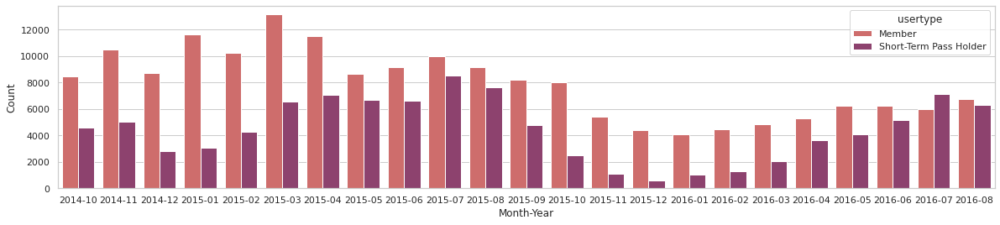

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.countplot(data=dfm,x="month_year", hue="usertype",palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Month-Year')
plt.ylabel('Count')
#plt.title('Qnty of Trips - 2014 to 2016')
plt.show()

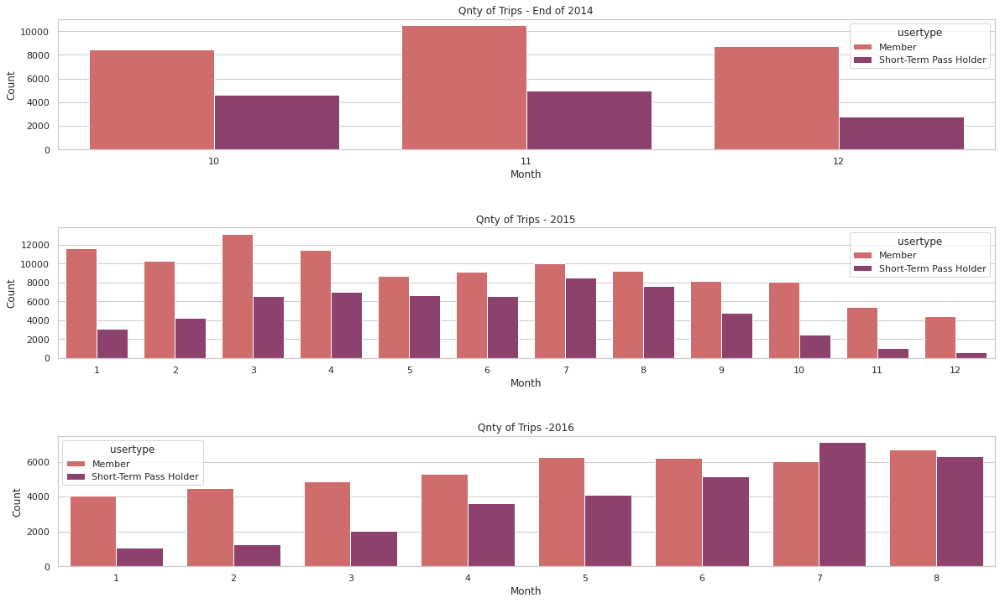

In [ ]:
fig = plt.figure(figsize=(20,12))
grid = plt.GridSpec(3, 1, hspace=0.6, wspace=0.2)
count_2014 = fig.add_subplot(grid[0, 0])
count_2014 = sns.countplot(data=dfm[dfm.year == 2014],x="month", hue="usertype",
                           hue_order=["Member","Short-Term Pass Holder"],palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Qnty of Trips - End of 2014')

count_2015 = fig.add_subplot(grid[1, 0])
count_2015 = sns.countplot(data=dfm[dfm.year == 2015],x="month", hue="usertype",
                           hue_order=["Member","Short-Term Pass Holder"],palette="flare")
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Qnty of Trips - 2015')

count_2016 = fig.add_subplot(grid[2, 0])
count_2016 = sns.countplot(data=dfm[dfm.year == 2016],x="month", hue="usertype",
                           hue_order=["Member","Short-Term Pass Holder"],palette="flare")
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Qnty of Trips -2016')

plt.show()

## Gênero

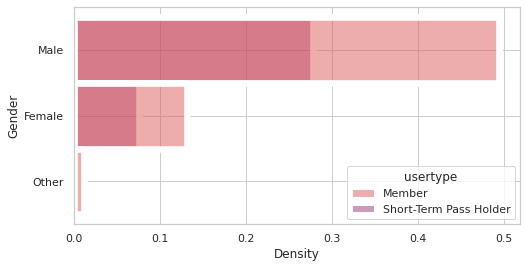

In [ ]:
plt.figure(figsize=(8,4))
ax = sns.histplot(data=dfm,y="gender", hue="usertype",palette="flare",stat="density")
sns.set(style="whitegrid")
plt.ylabel('Gender')
#plt.title('Density Total Trips')
plt.show()

## Faixa etária

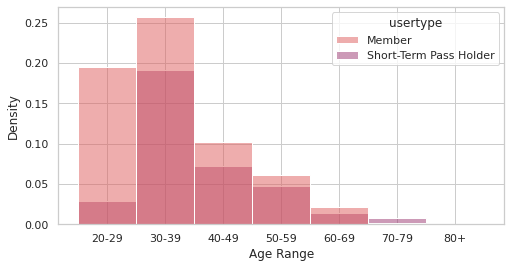

In [ ]:
plt.figure(figsize=(8,4))
ax = sns.histplot(data=dfm,x="agerange", hue="usertype",palette="flare",stat="density")
sns.set(style="whitegrid")
plt.xlabel('Age Range')
#plt.title('Density Total Trips')
plt.show()

## Duração do passeio

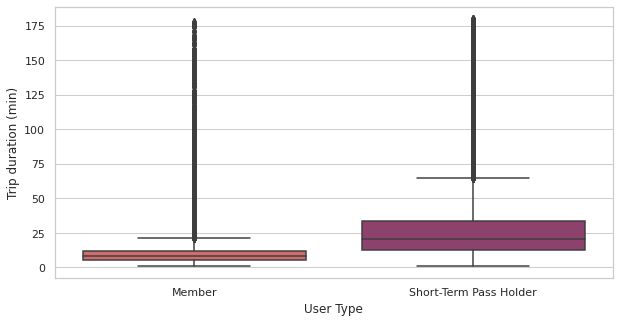

In [ ]:
plt.figure(figsize=(10,5))
ax = sns.boxplot(data=dfm, x = 'usertype', y = 'tripduration_m',palette="flare")
plt.xlabel('User Type')
plt.ylabel('Trip duration (min)')
#plt.title('Trip Duration')
plt.show()

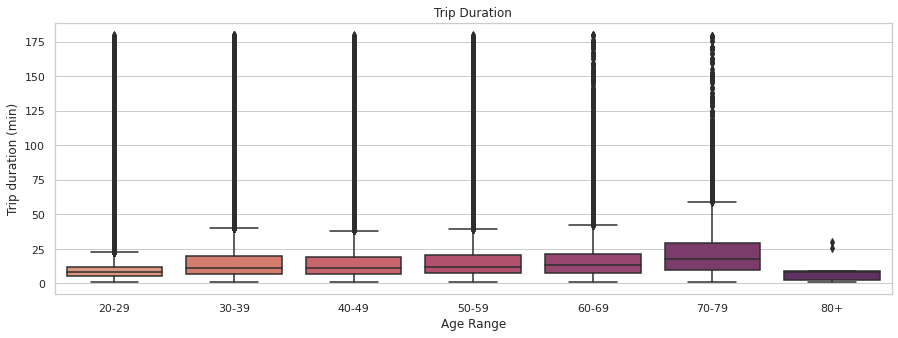

In [ ]:
plt.figure(figsize=(15,5))
ax = sns.boxplot(data=dfm, x = 'agerange', y = 'tripduration_m',palette="flare")
plt.xlabel('Age Range')
plt.ylabel('Trip duration (min)')
plt.title('Trip Duration')
plt.show()

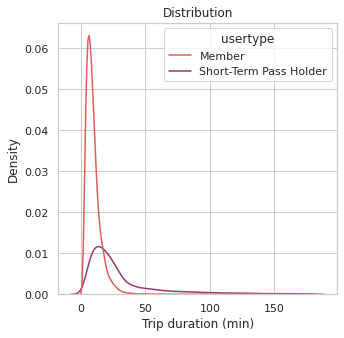

In [ ]:
plt.figure(figsize=(5,5))
ax = sns.kdeplot(data = dfm, x='tripduration_m',hue='usertype',palette='flare')
plt.xlabel('Trip duration (min)')
plt.title('Distribution')
plt.show()

In [ ]:
dfm[dfm.casual == 1].tripduration_m.describe()

count    102539.000000
mean         30.277770
std          30.366809
min           1.000000
25%          12.320000
50%          20.210000
75%          33.360000
max         179.980000
Name: tripduration_m, dtype: float64

In [ ]:
dfm[dfm.member == 1].tripduration_m.describe()

count    181313.000000
mean          9.584037
std           7.706412
min           1.000000
25%           5.400000
50%           7.980000
75%          11.610000
max         178.060000
Name: tripduration_m, dtype: float64

## Dia da semana

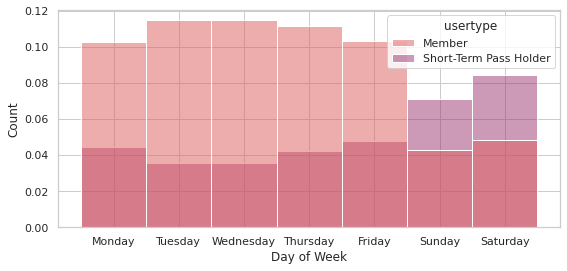

In [ ]:
plt.figure(figsize=(9,4))
ax = sns.histplot(data=dfm,x="dayofw",hue ="usertype",palette="flare",stat="density")
sns.set(style="whitegrid")
plt.xlabel('Day of Week')
plt.ylabel('Count')
#plt.title('Density - Day of Week')
plt.show()

## Hora do dia

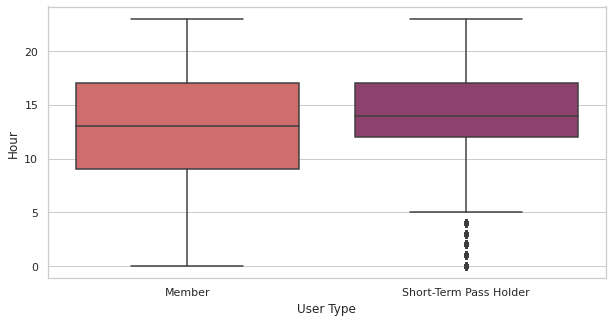

In [ ]:
plt.figure(figsize=(10,5))
ax = sns.boxplot(data=dfm, x = 'usertype', y = 'hour',palette="flare")
plt.xlabel('User Type')
plt.ylabel('Hour')
#plt.title('Hour')
plt.show()

## Estações do ano

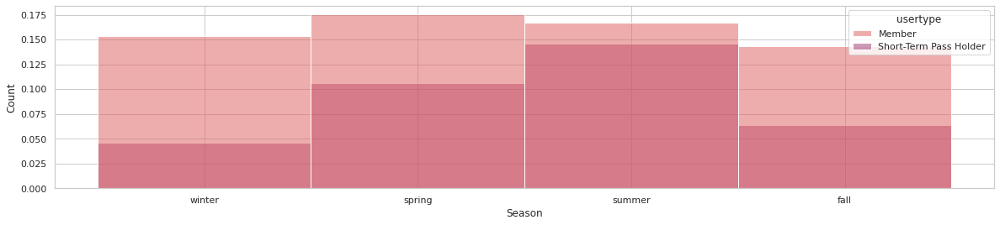

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.histplot(data=dfm,x="season",hue ="usertype",palette="flare",stat="density")
sns.set(style="whitegrid")
plt.xlabel('Season')
plt.ylabel('Count')
#plt.title('Density - Season')
plt.show()

## Influência dias chuvosos

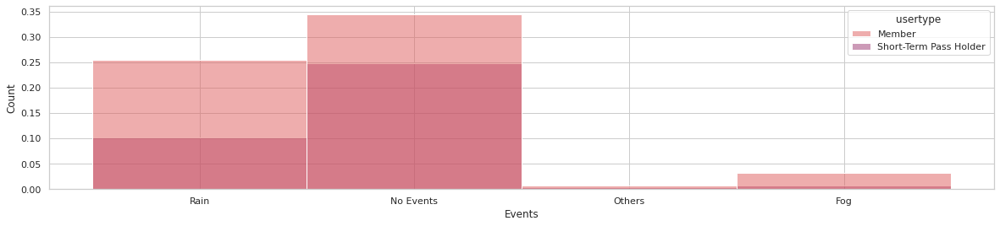

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.histplot(data=dfm,x="Events",hue ="usertype",palette="flare",stat="density")
sns.set(style="whitegrid")
plt.xlabel('Events')
plt.ylabel('Count')
#plt.title('Density - Events')
plt.show()

In [ ]:
df2['month_year'] = pd.to_datetime(df2['Date']).dt.to_period('M') #mês e ano
df2['year'] = pd.to_datetime(df2['Date'],format='%Y/%m/%d').dt.year #ano
df2['month'] = pd.to_datetime(df2['Date'],format='%Y/%m/%d').dt.month #mês

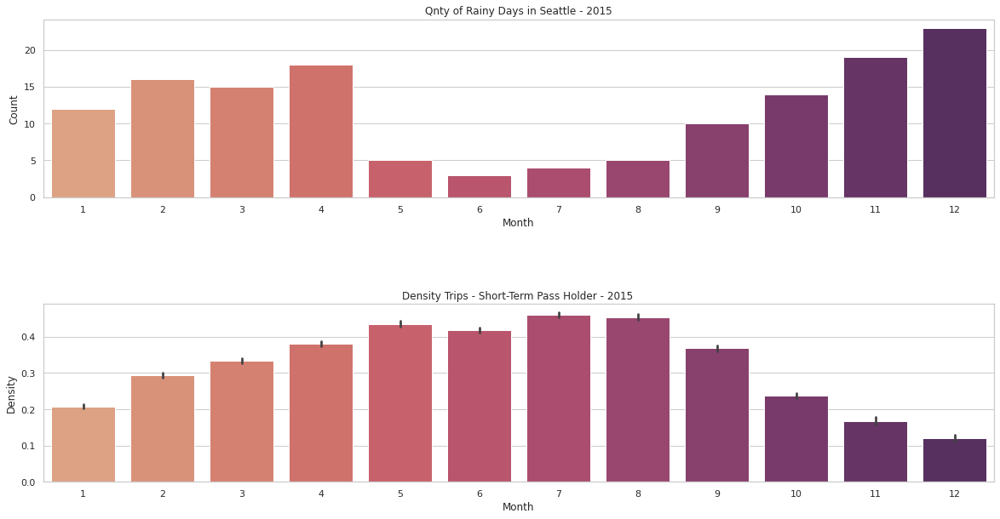

In [ ]:
fig = plt.figure(figsize=(20,10))
grid = plt.GridSpec(2, 1, hspace=0.6, wspace=0.2)
rainydays = fig.add_subplot(grid[0, 0])
rainydays = sns.countplot(data=df2[(df2.year == 2015) & (df2.Events == 'Rain')],x="month",palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Qnty of Rainy Days in Seattle - 2015')

casual_count = fig.add_subplot(grid[1,0])
casual_count = sns.barplot(data=dfm[(dfm.year == 2015)],x="month",y="casual",palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Month')
plt.ylabel('Density')
plt.title('Density Trips - Short-Term Pass Holder - 2015 ')

plt.show()

## Temperatura Média em C e Velocidade Média do Vento

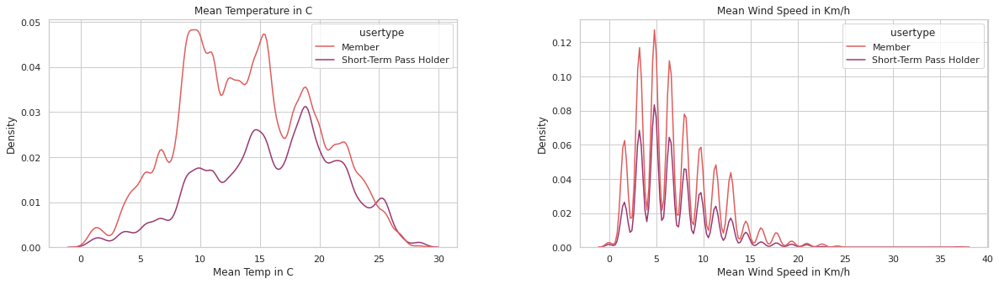

In [ ]:
fig = plt.figure(figsize=(20,5))
grid = plt.GridSpec(1, 2, hspace=0.6, wspace=0.3)
meantemp = fig.add_subplot(grid[0, 0])
meantemp = sns.kdeplot(data = dfm, x='Mean_Temperature_C',hue='usertype',palette='flare')
plt.title('Mean Temperature in C')
plt.xlabel('Mean Temp in C')

meanwind = fig.add_subplot(grid[0, 1])
meanwind = sns.kdeplot(data = dfm, x='Mean_Wind_Speed_KMH',hue='usertype',palette='flare')
plt.title('Mean Wind Speed in Km/h')
plt.xlabel('Mean Wind Speed in Km/h' )

plt.show()

## Top 5 estações de bike

Tirando do mapa as estações que já foram desativadas

In [ ]:
df3[df3.decommission_date.notnull()]

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date
10,CD-01,12th Ave & E Yesler Way,47.602103,-122.316923,5/22/2015,16,8/9/2016,0,8/9/2016
26,FH-01,Frye Art Museum / Terry Ave & Columbia St,47.607281,-122.324783,10/13/2014,16,3/18/2016,0,3/18/2016
38,SLU-18,Dexter Ave & Denny Way,47.618285,-122.342205,10/13/2014,20,11/2/2015,0,7/2/2016
46,UW-01,UW McCarty Hall / Whitman Ct,47.660268,-122.304826,10/13/2014,16,10/29/2015,0,10/29/2015


In [ ]:
dfm_geo = geopandas.GeoDataFrame(df3, geometry = geopandas.points_from_xy(df3.long, df3.lat))
dfm_geo.drop(index=[10,26,38,46],inplace=True)
dfm_geo.reset_index(inplace=True)

In [ ]:
m = fl.Map(location=[47.6, -122.3],tiles='OpenStreetMap',zoom_start=13,zoom_control=False) #mapa

In [ ]:
for i in range(0,len(dfm_geo)):
  fl.Marker([dfm_geo.loc[i,'lat'],dfm_geo.loc[i,'long']],tooltip= dfm_geo.loc[i,'name']).add_to(m) #marcadores

In [ ]:
from folium import plugins

In [ ]:
coord = []
for lat,long in zip(dfm.from_lat,dfm.from_long):
  coord.append([lat,long])

### Todas as estações de bike ativas

In [ ]:
m.add_child(plugins.HeatMap(coord)) #mapa de calor

In [ ]:
dfm.from_station_name.value_counts(normalize=True).nlargest(5)

Pier 69 / Alaskan Way & Clay St    0.045168
E Pine St & 16th Ave               0.040003
3rd Ave & Broad St                 0.038161
2nd Ave & Pine St                  0.035004
Westlake Ave & 6th Ave             0.034853
Name: from_station_name, dtype: float64

In [ ]:
dfm.to_station_name.value_counts(normalize=True).nlargest(5)

2nd Ave & Pine St                  0.048120
Pier 69 / Alaskan Way & Clay St    0.047482
Westlake Ave & 6th Ave             0.038185
3rd Ave & Broad St                 0.037470
PATH / 9th Ave & Westlake Ave      0.037329
Name: to_station_name, dtype: float64

In [ ]:
m2 = fl.Map(location=[47.6, -122.3],tiles='OpenStreetMap',zoom_start=13,zoom_control=False)

In [ ]:
df3.loc[df3.name == '2nd Ave & Pine St']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
9,CBD-13,2nd Ave & Pine St,47.610185,-122.339641,10/13/2014,18,NaN,18,NaN,POINT (-122.33964 47.61018)


In [ ]:
df3.loc[df3.name == 'Pier 69 / Alaskan Way & Clay St']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
52,WF-01,Pier 69 / Alaskan Way & Clay St,47.614315,-122.354093,10/13/2014,18,NaN,24,NaN,POINT (-122.35409 47.61432)


In [ ]:
df3.loc[df3.name == 'Westlake Ave & 6th Ave']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
35,SLU-15,Westlake Ave & 6th Ave,47.613628,-122.337341,10/13/2014,12,3/13/2015,20,NaN,POINT (-122.33734 47.61363)


In [ ]:
df3.loc[df3.name == '3rd Ave & Broad St']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
0,BT-01,3rd Ave & Broad St,47.618418,-122.350964,10/13/2014,18,NaN,18,NaN,POINT (-122.35096 47.61842)


In [ ]:
df3.loc[df3.name == 'E Pine St & 16th Ave']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
16,CH-07,E Pine St & 16th Ave,47.61533,-122.311752,10/13/2014,18,NaN,18,NaN,POINT (-122.31175 47.61533)


In [ ]:
fl.Marker([47.610185,-122.339641],tooltip='2nd Ave & Pine St',icon=fl.Icon(color='red')).add_to(m2)
fl.Marker([47.614315,-122.354093],tooltip='Pier 69 / Alaskan Way & Clay St',icon=fl.Icon(color='red')).add_to(m2)
fl.Marker([47.613628,-122.337341],tooltip='Westlake Ave & 6th Ave',icon=fl.Icon(color='red')).add_to(m2)
fl.Marker([47.618418,-122.350964],tooltip='3rd Ave & Broad St',icon=fl.Icon(color='red')).add_to(m2)
fl.Marker([47.61533,-122.311752],tooltip='E Pine St & 16th Ave',icon=fl.Icon(color='red')).add_to(m2)

m2

### As top 5 estações de bike mais frequentadas

In [ ]:
m2

# **Cycle Sharing CO** - Equipe de Operações

**Objetivo da análise dos dados:** entender a movimentação de bikes nas estações e otimizar as operações

## Quantidade de bikes da empresa

In [ ]:
dfm.bikeid.nunique()

492

## Quantidade de bikes por estação de bike (docas)

In [ ]:
df3[df3.decommission_date.isna()].current_dockcount.median()

18.0

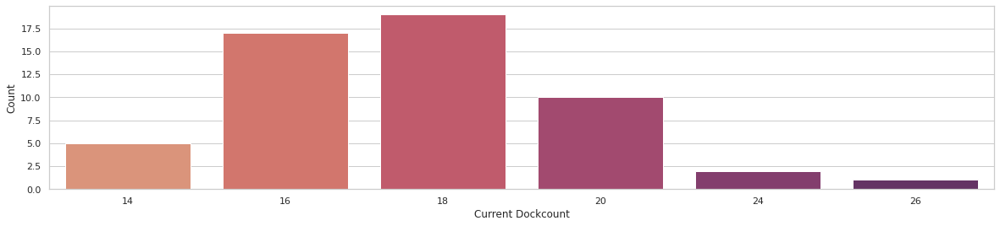

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.countplot(data=df3[df3.decommission_date.isna()],x="current_dockcount",palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Current Dockcount')
plt.ylabel('Count')
#plt.title('Current Dockcount - Bike Station')
plt.show()

## Ciclo de vida da bike - Quantidade de Passeios/Por Bike

In [ ]:
len(dfm)/dfm.bikeid.nunique()

576.9349593495934

In [ ]:
dfm.bikeid.value_counts(normalize=True).nlargest(5)

SEA00281    0.002921
SEA00035    0.002741
SEA00308    0.002684
SEA00456    0.002674
SEA00374    0.002667
Name: bikeid, dtype: float64

In [ ]:
dfm = dfm.sort_values(by="month_year")

In [ ]:
trips_bike = dfm.month_year.value_counts()
bike_permonth = dfm.groupby('month_year').bikeid.nunique()
trips_bike.sort_index()
trips_bike_month = trips_bike / bike_permonth

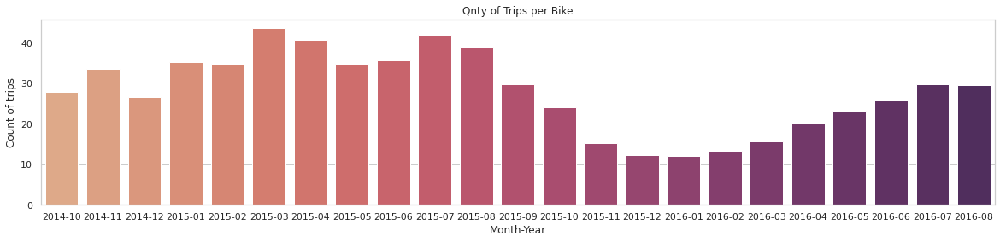

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.barplot(x=trips_bike_month.index,y = trips_bike_month.values,palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Month-Year')
plt.ylabel('Count of trips')
plt.title('Qnty of Trips per Bike')
plt.show()

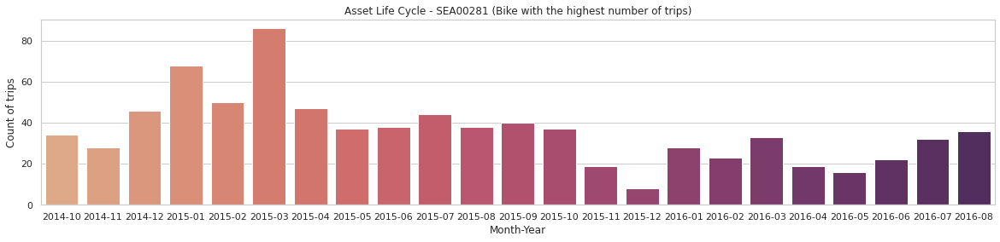

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.countplot(data=dfm.query('bikeid == "SEA00281"'),x="month_year",palette="flare")
sns.set(style="whitegrid")
y1 = range(0,100,20)
ax.set(yticks=y1)
plt.xlabel('Month-Year')
plt.ylabel('Count of trips')
plt.title('Asset Life Cycle - SEA00281 (Bike with the highest number of trips)')
plt.show()

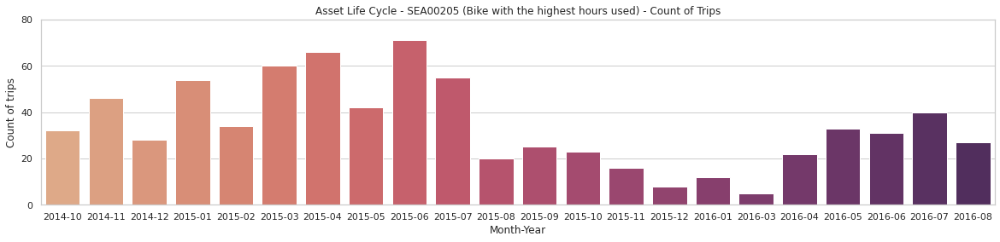

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.countplot(data=dfm.query('bikeid == "SEA00205"'),x="month_year",palette="flare")
sns.set(style="whitegrid")
y1 = range(0,100,20)
ax.set(yticks=y1)
plt.xlabel('Month-Year')
plt.ylabel('Count of trips')
plt.title('Asset Life Cycle - SEA00205 (Bike with the highest hours used) - Count of Trips')
plt.show()

## Ciclo de vida - Tempo de Uso/Por Bike

In [ ]:
time_used = dfm.groupby('bikeid')['tripduration_m'].sum()

In [ ]:
time_used = time_used/60

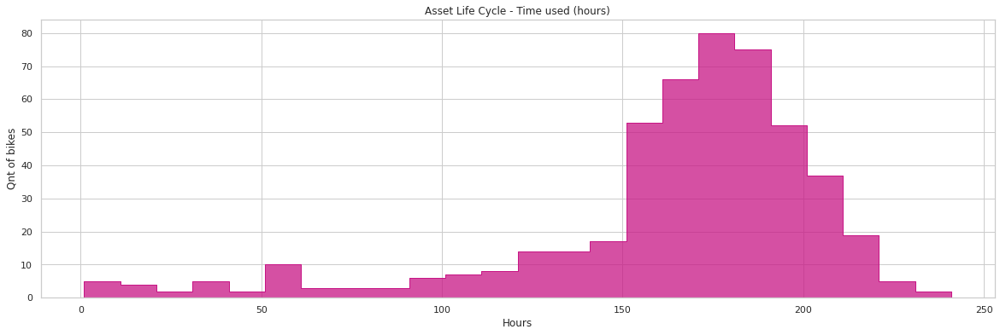

In [ ]:
plt.figure(figsize=(20,6))
ax = sns.histplot(x = time_used, binwidth=10, color="mediumvioletred",element='step')
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Qnt of bikes')
plt.title('Asset Life Cycle - Time used (hours)')
plt.show()

In [ ]:
time_month = dfm.groupby('month_year').tripduration_m.sum()/60
time_bike_month = time_month / bike_permonth

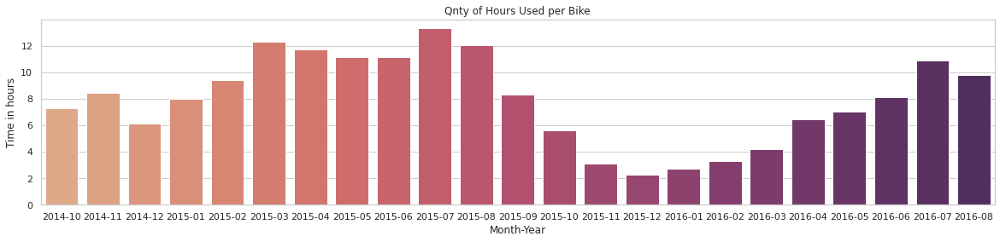

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.barplot(x=time_bike_month.index,y = time_bike_month.values,palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Month-Year')
plt.ylabel('Time in hours')
plt.title('Qnty of Hours Used per Bike')
plt.show()

In [ ]:
top_time_used_bike = dfm.groupby('bikeid')['tripduration_m'].sum()
top_time_used_bike.sort_values(ascending=False)

bikeid
SEA00205    14284.83
SEA00443    14246.19
SEA00341    13834.05
SEA00481    13558.12
SEA00374    13412.20
              ...   
SEA00130      635.18
SEA00018      484.63
SEA00331      373.20
SEA00378      240.56
SEA00020       57.24
Name: tripduration_m, Length: 492, dtype: float64

In [ ]:
time_month_sea00205 = dfm.query('bikeid == "SEA00205"').groupby('month_year').tripduration_m.sum()/60

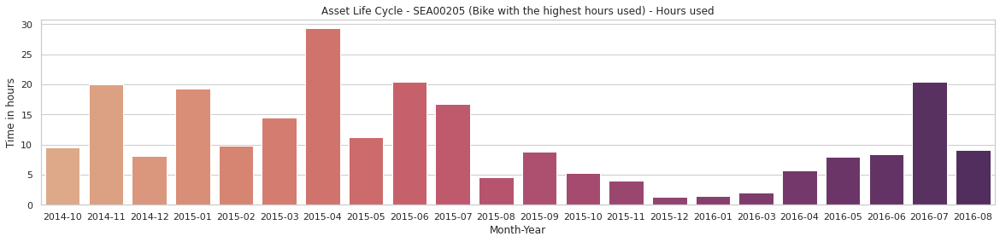

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.barplot(x=time_month_sea00205.index,y = time_month_sea00205.values,palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Month-Year')
plt.ylabel('Time in hours')
plt.title('Asset Life Cycle - SEA00205 (Bike with the highest hours used) - Hours used')
plt.show()

In [ ]:
time_month_sea00281 = dfm.query('bikeid == "SEA00281"').groupby('month_year').tripduration_m.sum()/60

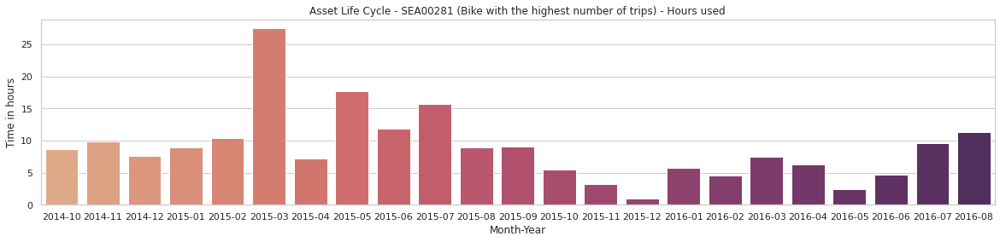

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.barplot(x=time_month_sea00281.index,y = time_month_sea00281.values,palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Month-Year')
plt.ylabel('Time in hours')
plt.title('Asset Life Cycle - SEA00281 (Bike with the highest number of trips) - Hours used')
plt.show()

## Top 5 de Estações de Embarque

In [ ]:
group_station_from = dfm.from_station_name.value_counts().nlargest(5)

In [ ]:
group_station_from

Pier 69 / Alaskan Way & Clay St    12821
E Pine St & 16th Ave               11355
3rd Ave & Broad St                 10832
2nd Ave & Pine St                   9936
Westlake Ave & 6th Ave              9893
Name: from_station_name, dtype: int64

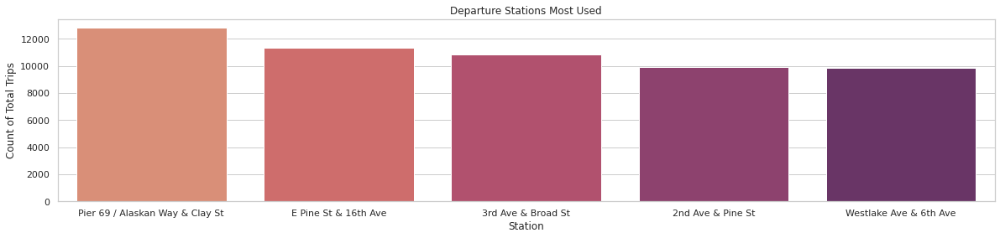

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.barplot(x = group_station_from.index, 
                   y= group_station_from, palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Station')
plt.ylabel('Count of Total Trips')
plt.title('Departure Stations Most Used')
plt.show()

## Top 5 Estações de Desembarque

In [ ]:
group_station_to = dfm.to_station_name.value_counts().nlargest(5)

In [ ]:
group_station_to

2nd Ave & Pine St                  13659
Pier 69 / Alaskan Way & Clay St    13478
Westlake Ave & 6th Ave             10839
3rd Ave & Broad St                 10636
PATH / 9th Ave & Westlake Ave      10596
Name: to_station_name, dtype: int64

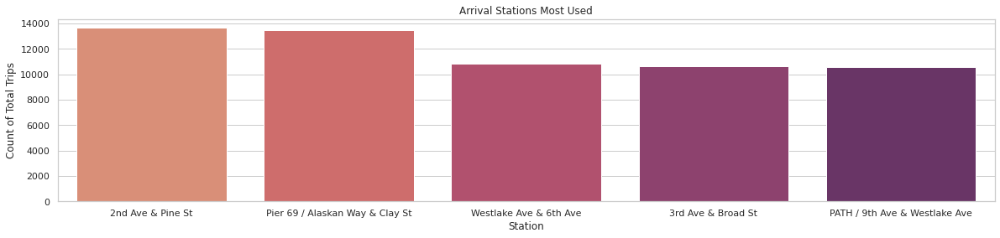

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.barplot(x = group_station_to.index, 
                   y= group_station_to, palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Station')
plt.ylabel('Count of Total Trips')
plt.title('Arrival Stations Most Used')
plt.show()

## Estações mais utilizadas em dias de chuva

In [ ]:
group_rainy_station_to = dfm[dfm.Events == 'Rain'].to_station_name.value_counts().nlargest(3)

In [ ]:
group_rainy_station_from = dfm[dfm.Events == 'Rain'].from_station_name.value_counts().nlargest(3)

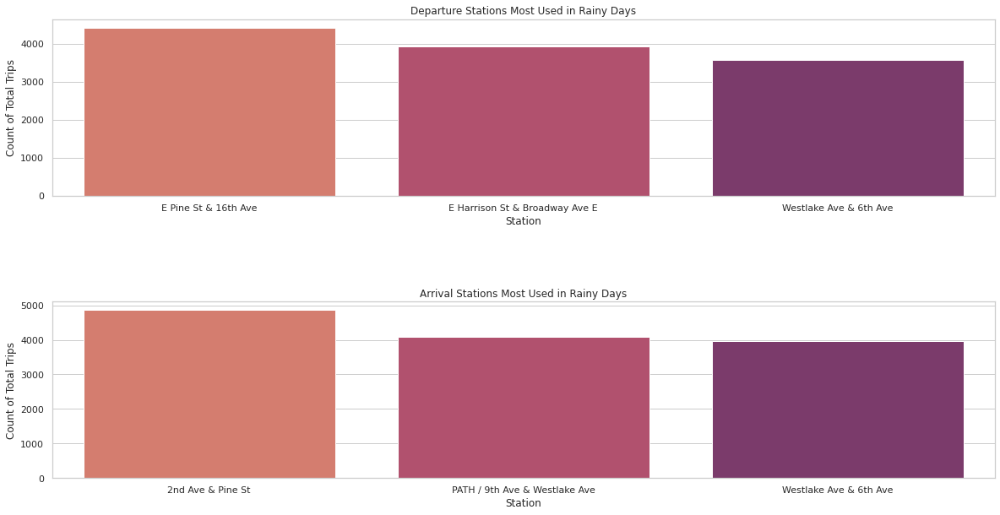

In [ ]:
fig = plt.figure(figsize=(20,10))
grid = plt.GridSpec(2, 1, hspace=0.6, wspace=0.2)
rainy_station_from = fig.add_subplot(grid[0, 0])
rainy_station_from = sns.barplot(x = group_rainy_station_from.index, y = group_rainy_station_from ,palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Station')
plt.ylabel('Count of Total Trips')
plt.title('Departure Stations Most Used in Rainy Days')

rainy_station_to = fig.add_subplot(grid[1,0])
rainy_station_to = sns.barplot(x = group_rainy_station_to.index, y = group_rainy_station_to,palette="flare")
sns.set(style="whitegrid")
plt.xlabel('Station')
plt.ylabel('Count of Total Trips')
plt.title('Arrival Stations Most Used in Rainy Days')

plt.show()

In [ ]:
df3.loc[df3.name == 'PATH / 9th Ave & Westlake Ave']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
34,SLU-07,PATH / 9th Ave & Westlake Ave,47.61832,-122.338913,10/13/2014,18,NaN,18,NaN,POINT (-122.33891 47.61832)


In [ ]:
df3.loc[df3.name == 'E Harrison St & Broadway Ave E']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
12,CH-02,E Harrison St & Broadway Ave E,47.622063,-122.321251,10/13/2014,18,2/24/2015,20,NaN,POINT (-122.32125 47.62206)


In [ ]:
m3 = fl.Map(location=[47.6, -122.3],tiles='OpenStreetMap',zoom_start=13,zoom_control=False)

fl.Marker([47.61533,-122.311752],tooltip='E Pine St & 16th Ave',icon=fl.Icon(color='blue')).add_to(m3)
fl.Marker([47.622063,-122.321251],tooltip='E Harrison St & Broadway Ave E',icon=fl.Icon(color='blue')).add_to(m3)
fl.Marker([47.613628,-122.337341],tooltip='Westlake Ave & 6th Ave',icon=fl.Icon(color='black')).add_to(m3)

fl.Marker([47.610185,-122.339641],tooltip='2nd Ave & Pine St',icon=fl.Icon(color='red')).add_to(m3)
fl.Marker([47.61832,-122.338913],tooltip='PATH / 9th Ave & Westlake Ave',icon=fl.Icon(color='red')).add_to(m3)

m3

In [ ]:
m2

## Necessidade de instalação de mais docas / Horário de reabastecimento

### Função para verificar necessidade de cada estação

In [ ]:
def dockcount_day(station_name,dockcount):
  
  station = []
  station.append(station_name) 
  dfm_station = dfm[dfm['from_station_name'].isin(station) | dfm['to_station_name'].isin(station)].copy() #filtro pela station name
  dfm_station_from = dfm_station[dfm_station['from_station_name'].isin(station)].copy() # so info de partida
  dfm_station_to = dfm_station[dfm_station['to_station_name'].isin(station)].copy() #so info de chegada
  group_station_from = dfm_station_from.groupby(['start_date','hour'])['from_dockcount'].count() #agrupando por data completa as infos de partida
  group_station_to = dfm_station_to.groupby(['start_date','hour'])['to_dockcount'].count() #agrupando por data completa as infos de chegada
  dfm_station_count = pd.merge(group_station_from,group_station_to,on=["start_date","hour"],how="outer") #juntando as infos
  dfm_station_count = dfm_station_count.fillna(0) #preencher nan
  dfm_station_count['delta'] = dfm_station_count['to_dockcount'] - dfm_station_count['from_dockcount'] #contagem variacao bikes que chegam - as bikes que saem
  dfm_station_count.reset_index(inplace=True) #resetar multi_index (data e hora)
  dfm_station_count['counter'] = None #criar coluna de contador de bike nas docas
  dfm_station_count.iloc[0,5] = dockcount + dfm_station_count.iloc[0,4] #abastecimento diario de docas no valor do dockcount
  for i in range(1,len(dfm_station_count)): #calculo do contador
    if dfm_station_count.iloc[i,0] == dfm_station_count.iloc[i-1,0]:
      dfm_station_count.iloc[i,5] = dfm_station_count.iloc[i-1,5] + dfm_station_count.iloc[i,4]
    else:
      dfm_station_count.iloc[i,5] = 24 + dfm_station_count.iloc[0,4]
  dfm_station_count['counter'] = dfm_station_count['counter'].apply(float)

  return dfm_station_count

### Análise **Pier 69 / Alaskan Way & Clay St**

In [ ]:
df3.loc[df3.name == 'Pier 69 / Alaskan Way & Clay St']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
52,WF-01,Pier 69 / Alaskan Way & Clay St,47.614315,-122.354093,10/13/2014,18,NaN,24,NaN,POINT (-122.35409 47.61432)


In [ ]:
dock_pier = dockcount_day('Pier 69 / Alaskan Way & Clay St',24)

In [ ]:
dock_pier.counter.describe()

count    6210.000000
mean       19.448309
std         4.273503
min       -16.000000
25%        17.000000
50%        20.000000
75%        21.000000
max        48.000000
Name: counter, dtype: float64

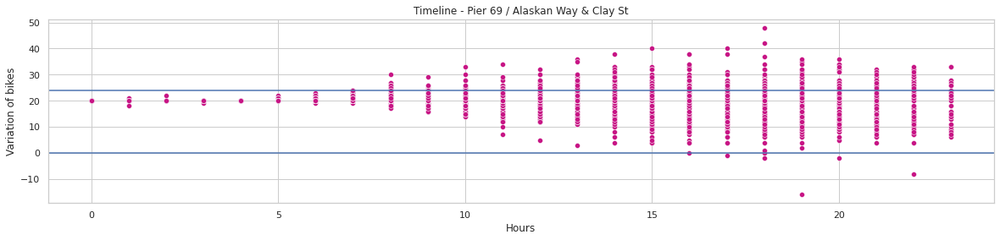

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.scatterplot(data = dock_pier, x = "hour",y = "counter",color="mediumvioletred")
ax.axhline(24)
ax.axhline(0)
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Variation of bikes')
plt.title('Timeline - Pier 69 / Alaskan Way & Clay St')
plt.show()

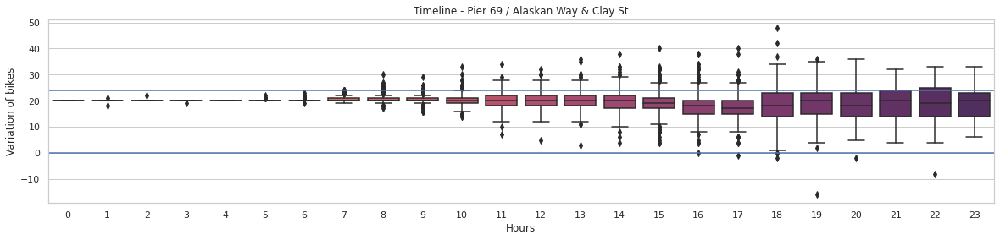

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.boxplot(data = dock_pier, x = "hour",y = "counter",palette = "flare")
ax.axhline(24)
ax.axhline(0)
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Variation of bikes')
plt.title('Timeline - Pier 69 / Alaskan Way & Clay St')
plt.show()

### Análise **E Pine St & 16th Ave**

In [ ]:
df3.loc[df3.name == 'E Pine St & 16th Ave']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
16,CH-07,E Pine St & 16th Ave,47.61533,-122.311752,10/13/2014,18,NaN,18,NaN,POINT (-122.31175 47.61533)


In [ ]:
dock_epine = dockcount_day('E Pine St & 16th Ave',18)

In [ ]:
dock_epine.counter.describe()

count    6523.000000
mean       15.531811
std         6.257901
min        -8.000000
25%        11.000000
50%        16.000000
75%        22.000000
max        38.000000
Name: counter, dtype: float64

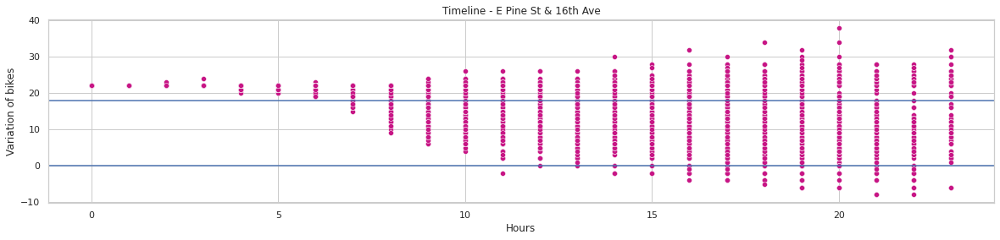

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.scatterplot(data = dock_epine, x = "hour",y = "counter",color="mediumvioletred")
ax.axhline(18)
ax.axhline(0)
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Variation of bikes')
plt.title('Timeline - E Pine St & 16th Ave')
plt.show()

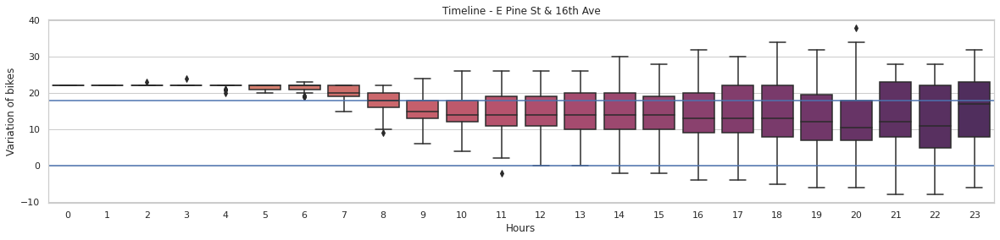

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.boxplot(data = dock_epine, x = "hour",y = "counter",palette="flare")
ax.axhline(18)
ax.axhline(0)
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Variation of bikes')
plt.title('Timeline - E Pine St & 16th Ave')
plt.show()

### Análise **3rd Ave & Broad St**

In [ ]:
df3.loc[df3.name == '3rd Ave & Broad St']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
0,BT-01,3rd Ave & Broad St,47.618418,-122.350964,10/13/2014,18,NaN,18,NaN,POINT (-122.35096 47.61842)


In [ ]:
dock_3rd = dockcount_day('3rd Ave & Broad St',18)

In [ ]:
dock_3rd.counter.describe()

count    6757.000000
mean       16.949386
std         5.195507
min        -8.000000
25%        14.000000
50%        18.000000
75%        19.000000
max        58.000000
Name: counter, dtype: float64

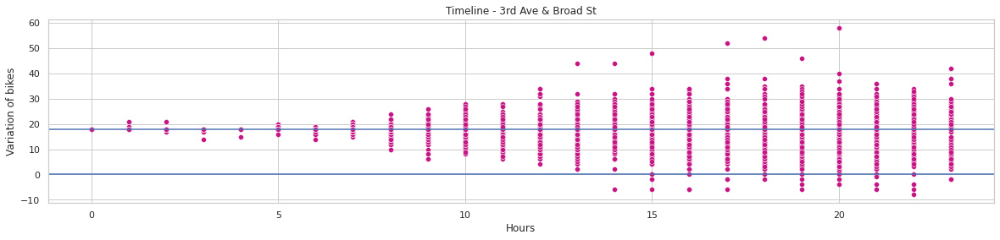

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.scatterplot(data = dock_3rd, x = "hour",y = "counter",color="mediumvioletred")
ax.axhline(18)
ax.axhline(0)
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Variation of bikes')
plt.title('Timeline - 3rd Ave & Broad St')
plt.show()

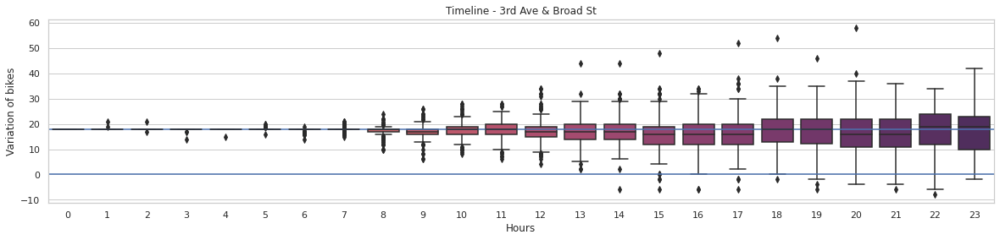

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.boxplot(data = dock_3rd, x = "hour",y = "counter",palette="flare")
ax.axhline(18)
ax.axhline(0)
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Variation of bikes')
plt.title('Timeline - 3rd Ave & Broad St')
plt.show()

### Análise **2nd Ave & Pine St**

In [ ]:
df3.loc[df3.name == '2nd Ave & Pine St']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
9,CBD-13,2nd Ave & Pine St,47.610185,-122.339641,10/13/2014,18,NaN,18,NaN,POINT (-122.33964 47.61018)


In [ ]:
dock_2nd = dockcount_day('2nd Ave & Pine St',18)

In [ ]:
dock_2nd.counter.describe()

count    7415.000000
mean       27.075253
std         5.130401
min        -8.000000
25%        25.000000
50%        26.000000
75%        29.000000
max        60.000000
Name: counter, dtype: float64

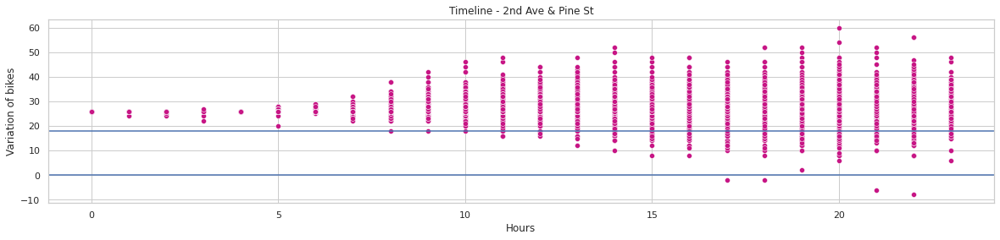

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.scatterplot(data = dock_2nd, x = "hour",y = "counter",color="mediumvioletred")
ax.axhline(18)
ax.axhline(0)
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Variation of bikes')
plt.title('Timeline - 2nd Ave & Pine St')
plt.show()

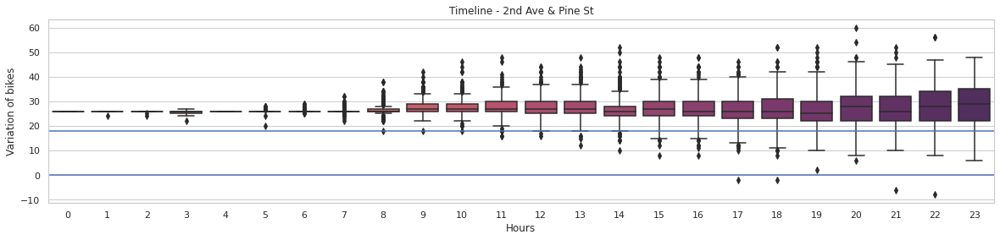

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.boxplot(data = dock_2nd, x = "hour",y = "counter",palette="flare")
ax.axhline(18)
ax.axhline(0)
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Variation of bikes')
plt.title('Timeline - 2nd Ave & Pine St')
plt.show()

### Análise **Westlake Ave & 6th Ave**

In [ ]:
df3.loc[df3.name == 'Westlake Ave & 6th Ave']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
35,SLU-15,Westlake Ave & 6th Ave,47.613628,-122.337341,10/13/2014,12,3/13/2015,20,NaN,POINT (-122.33734 47.61363)


In [ ]:
dock_westlake = dockcount_day('Westlake Ave & 6th Ave',20)

In [ ]:
dock_westlake.counter.describe()

count    7040.000000
mean       31.622585
std         4.482198
min        10.000000
25%        30.000000
50%        32.000000
75%        34.000000
max        70.000000
Name: counter, dtype: float64

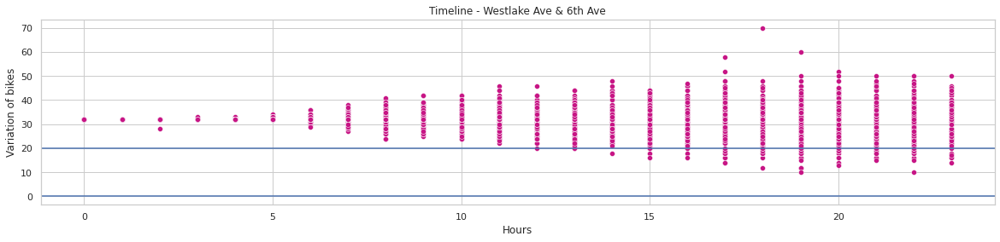

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.scatterplot(data = dock_westlake, x = "hour",y = "counter",color="mediumvioletred")
ax.axhline(20)
ax.axhline(0)
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Variation of bikes')
plt.title('Timeline - Westlake Ave & 6th Ave')
plt.show()

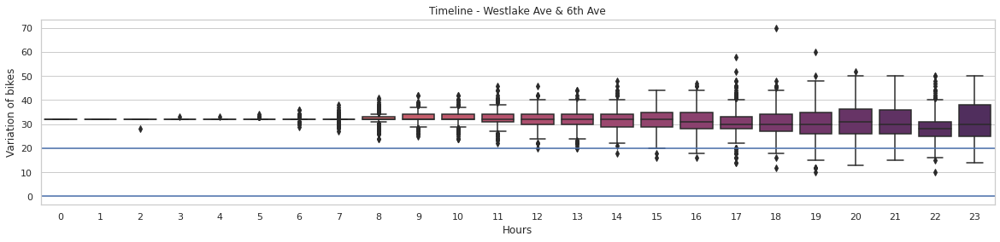

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.boxplot(data = dock_westlake, x = "hour",y = "counter",palette="flare")
ax.axhline(20)
ax.axhline(0)
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Variation of bikes')
plt.title('Timeline - Westlake Ave & 6th Ave')
plt.show()

### Análise **PATH / 9th Ave & Westlake Ave**

In [ ]:
df3.loc[df3.name == 'PATH / 9th Ave & Westlake Ave']

,station_id,name,lat,long,install_date,install_dockcount,modification_date,current_dockcount,decommission_date,geometry
34,SLU-07,PATH / 9th Ave & Westlake Ave,47.61832,-122.338913,10/13/2014,18,NaN,18,NaN,POINT (-122.33891 47.61832)


In [ ]:
dock_path = dockcount_day('PATH / 9th Ave & Westlake Ave',18)

In [ ]:
dock_path.counter.describe()

count    6430.000000
mean       23.325039
std         4.958573
min         0.000000
25%        21.000000
50%        22.000000
75%        26.000000
max        60.000000
Name: counter, dtype: float64

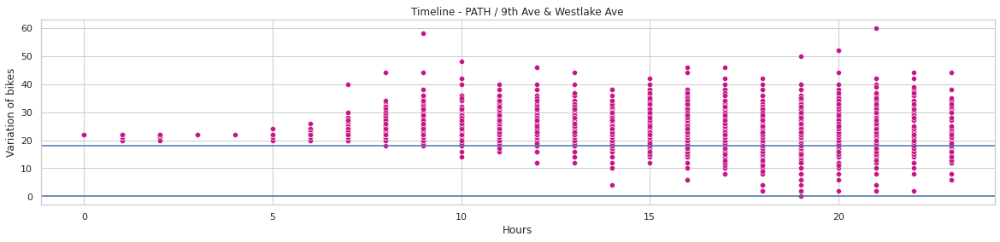

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.scatterplot(data = dock_path, x = "hour",y = "counter",color="mediumvioletred")
ax.axhline(18)
ax.axhline(0)
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Variation of bikes')
plt.title('Timeline - PATH / 9th Ave & Westlake Ave')
plt.show()

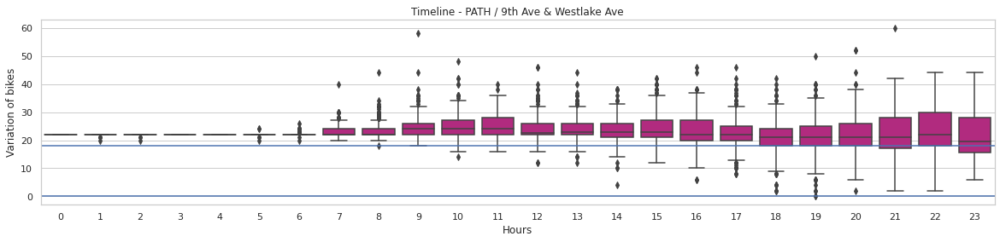

In [ ]:
plt.figure(figsize=(20,4))
ax = sns.boxplot(data = dock_path, x = "hour",y = "counter",color="mediumvioletred")
ax.axhline(18)
ax.axhline(0)
sns.set(style="whitegrid")
plt.xlabel('Hours')
plt.ylabel('Variation of bikes')
plt.title('Timeline - PATH / 9th Ave & Westlake Ave')
plt.show()

In [ ]:
%%shell
jupyter nbconvert --to html /content/Projeto_01_Raquel_Reis.ipynb

[NbConvertApp] Converting notebook /content/Projeto_01_Raquel_Reis.ipynb to html
[NbConvertApp] Writing 14001734 bytes to /content/Projeto_01_Raquel_Reis.html
